In [1]:
# mxnet 1.6.0
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
import visdom

import mxnet as mx
from mxnet import gluon
from mxnet import autograd
from mxnet import image

import sys
sys.path.append('../../resuneta/src')
sys.path.append('../../resuneta/nn/loss')
sys.path.append('../../resuneta/models')
sys.path.append('../../')
sys.path.append('../MXNet-ResUNeta/')

from bound_dist import get_distance, get_boundary
from loss import Tanimoto_wth_dual
from resunet_d6_causal_mtskcolor_ddist import *
from resunet_d7_causal_mtskcolor_ddist import *

from datasets import *

# reduce to k dimensions
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
%matplotlib inline

In [1]:
# geopython
import numpy as np
import pandas as pd
import os
import sys
import geopandas as gpd
import shapely
import matplotlib.pyplot as plt
%matplotlib inline

# Get encodings from ResUNet-a

## Load model

In [5]:
# ==================== USER SETTINGS ==================== #
n_filters = 16
n_classes = 1
hsv_channels = 3

# original model
# model_name = 'resunet-d6_aprJulOctSeparate_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001/'

# 4x downsampled
# model_name = 'resunet-d6_aprJulOctSeparate_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_4x-downsampled/'

# 8x downsampled
# model_name = 'resunet-d6_aprJulOctSeparate_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_8x-downsampled/'

# 1x-8x combined
model_name = 'resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/'

file_name = '../experiments/france/sherrie10k/{}/model.params'.format(model_name)
model = ResUNet_d6(_nfilters_init=n_filters, 
                   _NClasses=n_classes,
                   hsv_outchannels=hsv_channels)
gpu = 0
model.load_parameters(file_name, ctx=mx.cpu()) #, ctx=mx.gpu(gpu))
# ======================================================= #

## France: Create dataloaders

In [53]:
# ==================== USER SETTINGS ==================== #
month = '2019_04'
image_directories = '../data/planet/france/sherrie10k/monthly_mosaics_renamed_clipped_merged/1250px/4x_downsample/{}/'.format(month)
label_directory = '../data/planet/france/sherrie10k/extent_labels/1250px/4x_downsample/'
batch_size = 8

# no trees except vines are kept as classes to predict
classes = list(range(1,10)) + [11,14,15,16,17,18,19,21,24,25,26,27]
splits_df = pd.read_csv('../data/splits/sherrie10k_planetImagery_splits_20x20_4x-downsampled.csv')
splits_df['image_id'] = splits_df['image_id'].astype(str).str.zfill(5)
imgs_in_folder = [x.split('.')[0] for x in os.listdir(label_directory)]
splits_df = splits_df[splits_df['image_id'].isin(imgs_in_folder)].reset_index(drop=True)
save_dir = '../results/france/sherrie10k/{}/{}'.format(model_name, month)
# ======================================================= #

train_names = splits_df[splits_df['fold'] == 'train']['image_id'].values
val_names = splits_df[splits_df['fold'] == 'val']['image_id'].values

# setting fold = 'val' means no data augmentation
train_dataset = PlanetDatasetWithClasses(image_directories, label_directory, classes=classes,
                                         image_names=train_names, fold='val', image_suffix='_{}.tif'.format(month))
val_dataset = PlanetDatasetWithClasses(image_directories, label_directory, classes=classes,
                                       image_names=val_names, fold='val', image_suffix='_{}.tif'.format(month))

train_dataloader = gluon.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
val_dataloader = gluon.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)
#     os.makedirs(os.path.join(save_dir, 'boundary_predictions'))
#     os.makedirs(os.path.join(save_dir, 'extent_predictions'))

## Feed data through model

In [4]:
# Save all predictions for training and validation sets
all_dataloaders = {'train': train_dataloader, 'val': val_dataloader}
all_names = {'train': train_names, 'val': val_names}

# feature vectors
feature_vectors = {'train': np.zeros((len(train_names), 512, 8, 8)),
                   'val': np.zeros((len(val_names), 512, 8, 8))}

for fold in all_dataloaders:
    print(fold)
    
    current_dataloader = all_dataloaders[fold]
    for batch_i, (img, extent, boundary, distance, hsv) in enumerate(current_dataloader): # val_dataloader

        if batch_i % 50 == 0:
            print("    batch {}".format(batch_i))
            
        features = model.features(img)
        feature_vectors[fold][batch_i*batch_size: (batch_i+1)*batch_size] = features.asnumpy()

train
    batch 0
    batch 50
    batch 100
    batch 250
    batch 300
    batch 350
    batch 400
    batch 450
    batch 500
    batch 550
    batch 600
    batch 650
    batch 700
    batch 750
    batch 800
val
    batch 0
    batch 50
    batch 100
    batch 150


In [6]:
# save feature vectors
save_dir = '../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/'

save_name = 'feature_vectors_train_{}.npy'.format(month)
np.save(os.path.join(save_dir, save_name), feature_vectors['train'])

save_name = 'feature_vectors_val_{}.npy'.format(month)
np.save(os.path.join(save_dir, save_name), feature_vectors['val'])

## France: Reduce dimensionality of features

### PCA

The training features have dimension $(6759, 512, 8, 8)$.

There are 6759 samples, each with an $512*8*8 = 32,768$ dimensional vector.

In [44]:
save_dir = '../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/'
features_train = []
features_val = []
for month in ['2019_04', '2019_07', '2019_10']:
    features_train.append(np.load(os.path.join(save_dir, 'feature_vectors_train_{}.npy'.format(month))))
    features_val.append(np.load(os.path.join(save_dir, 'feature_vectors_val_{}.npy'.format(month))))

In [45]:
# X_train = feature_vectors['train'].copy()
X_train = np.array(features_train)
X_train = X_train.reshape(X_train.shape[0] * X_train.shape[1], -1)

# X_val = feature_vectors['val'].copy()
X_val = np.array(features_val)
X_val = X_val.reshape(X_val.shape[0] * X_val.shape[1], -1)

In [5]:
pca = PCA(n_components=20)
pca.fit(X_train)

PCA(n_components=20)

In [49]:
from joblib import dump, load
dump(pca, '../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/pca_full_features.joblib')

['../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/pca_full_features.joblib']

In [6]:
X_pca_train = pca.transform(X_train)
X_pca_val = pca.transform(X_val)
print(pca.explained_variance_ratio_)

[0.20933084 0.03271742 0.02654116 0.02604923 0.01797535 0.01591237
 0.0141529  0.01132782 0.01079367 0.01027233 0.00985915 0.0089076
 0.0084903  0.00807845 0.00782022 0.00731286 0.00690193 0.00677
 0.00653092 0.00638749]


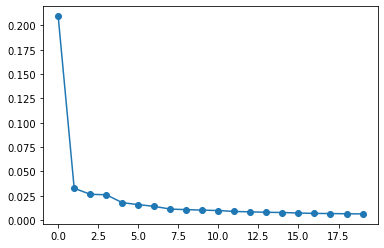

In [7]:
plt.plot(pca.explained_variance_ratio_, 'o-')
plt.show()

In [22]:
len(features_val[2])

1546

In [24]:
train_sizes

[0, 6759, 13518, 20277]

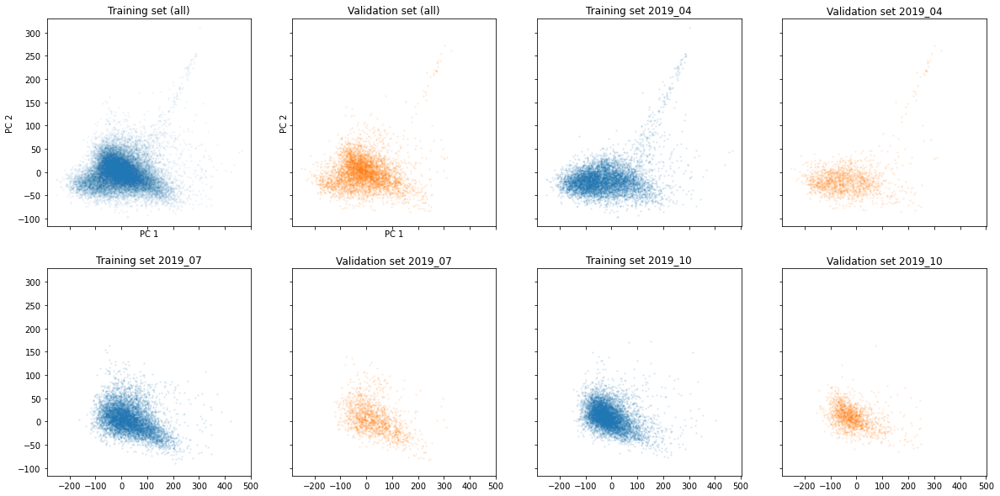

In [27]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10), sharex=True, sharey=True)

ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.05)
ax[0,0].set_xlabel('PC 1')
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('Training set (all)')

ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.1, color='C1')
ax[0,1].set_xlabel('PC 1')
ax[0,1].set_ylabel('PC 2')
ax[0,1].set_title('Validation set (all)')

train_sizes = [0]
val_sizes = [0]
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    train_sizes.append(len(features_train[m])+train_sizes[m])
    val_sizes.append(len(features_val[m])+val_sizes[m])
    i = (m+1) // 2
    j = (m+1)*2 % 4
    ax[i,j].scatter(X_pca_train[train_sizes[m]:train_sizes[m+1],0], 
                    X_pca_train[train_sizes[m]:train_sizes[m+1],1], 
                    s=2, alpha=0.1)
    ax[i,j+1].scatter(X_pca_val[val_sizes[m]:val_sizes[m+1],0], 
                      X_pca_val[val_sizes[m]:val_sizes[m+1],1], 
                      s=2, alpha=0.1, color='C1')
    ax[i,j].set_title('Training set {}'.format(month))
    ax[i,j+1].set_title('Validation set {}'.format(month))
plt.show()

In [51]:
mccs = pd.DataFrame({})
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    temp = pd.read_csv('../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/metrics_by_image_4x-downsampled_trainval_{}.csv'.format(month))
    temp['month'] = month
    mccs = pd.concat([mccs, temp]).reset_index(drop=True)
mccs['image_id'] = mccs['image_id'].astype(str).str.zfill(5)

In [32]:
mccs.head()

,image_id,MCC,accuracy,lat,lon,fold,month
0,00001,0.702094,0.859726,49.557181,0.591338,train,2019_04
1,00004,0.556556,0.779221,44.683271,2.670917,train,2019_04
2,00005,0.632938,0.825211,49.262867,-1.543390,train,2019_04
3,00006,0.729636,0.889511,48.612362,4.856614,train,2019_04
4,00007,0.605578,0.855209,46.361416,3.268474,train,2019_04


In [54]:
mccs_train = []
for month in ['2019_04', '2019_07', '2019_10']:
    for image_id in train_names:
        mcc = mccs[mccs['image_id'] == image_id]['MCC'].values[0]
        mccs_train.append(mcc)

mccs_val = []
for month in ['2019_04', '2019_07', '2019_10']:
    for image_id in val_names:
        mcc = mccs[mccs['image_id'] == image_id]['MCC'].values[0]
        mccs_val.append(mcc)

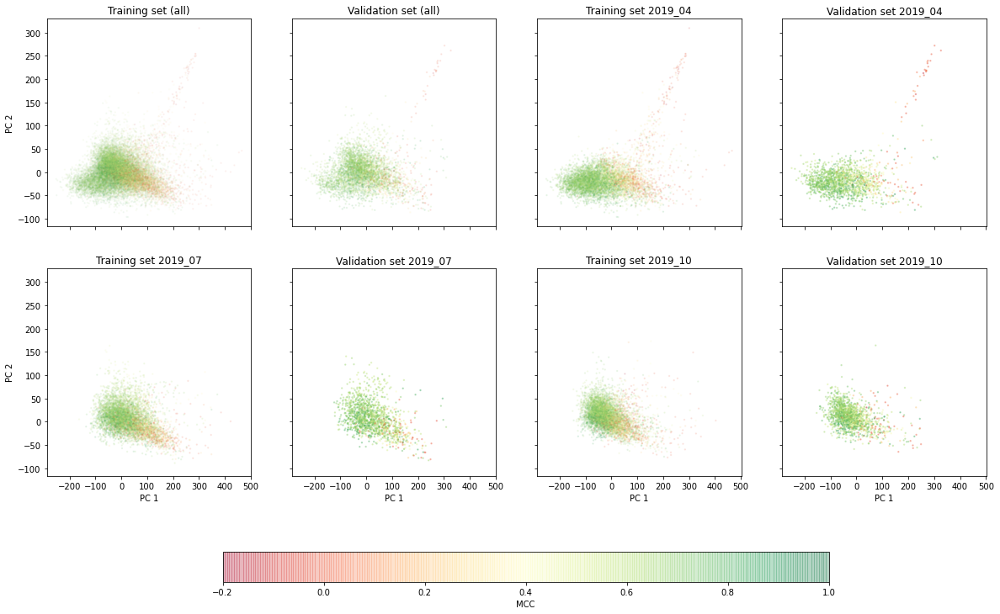

In [51]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10), sharex=True, sharey=True)

ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.05, 
                c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('Training set (all)')

ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.1,
                c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_title('Validation set (all)')

train_sizes = [0]
val_sizes = [0]
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    train_sizes.append(len(features_train[m])+train_sizes[m])
    val_sizes.append(len(features_val[m])+val_sizes[m])
    i = (m+1) // 2
    j = (m+1)*2 % 4
    ax[i,j].scatter(X_pca_train[train_sizes[m]:train_sizes[m+1],0], 
                    X_pca_train[train_sizes[m]:train_sizes[m+1],1], 
                    s=2, alpha=0.1, c=mccs_train[train_sizes[m]:train_sizes[m+1]], cmap='RdYlGn', vmin=-0.2, vmax=1)
    im = ax[i,j+1].scatter(X_pca_val[val_sizes[m]:val_sizes[m+1],0], 
                      X_pca_val[val_sizes[m]:val_sizes[m+1],1], 
                      s=2, alpha=0.3, c=mccs_val[val_sizes[m]:val_sizes[m+1]], cmap='RdYlGn', vmin=-0.2, vmax=1)
    ax[i,j].set_title('Training set {}'.format(month))
    ax[i,j+1].set_title('Validation set {}'.format(month))
    
    if i == 1:
        ax[i,j].set_xlabel('PC 1')
        ax[i,j+1].set_xlabel('PC 1')
    if j == 0:
        ax[i,j].set_ylabel('PC 2')
    

cax = fig.add_axes([0.27, -0.05, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('MCC')

plt.show()

### Fit a sigmoid

In [42]:
from scipy.optimize import curve_fit

In [43]:
def sigmoid(x, L, x0, k, b):
    y = L / (1 + np.exp(-k*(x-x0))) + b
    return y

xdata = X_pca_train[:,0]
ydata = mccs_train
p0 = [max(ydata), np.median(xdata), 1, min(ydata)] # this is an mandatory initial guess

popt, pcov = curve_fit(sigmoid, xdata, ydata, p0, method='dogbox')

/home/swang222/anaconda3/envs/mxnet1.6.0/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: overflow encountered in exp
  from ipykernel import kernelapp as app


In [44]:
popt

array([-4.76901086e-01,  5.68369868e+01,  1.57155447e-02,  7.17156669e-01])

In [48]:
mcc_value = 0.6
np.log(popt[0] / (mcc_value - popt[3]) - 1) / (-popt[2]) + popt[1]

-14.549768368463859

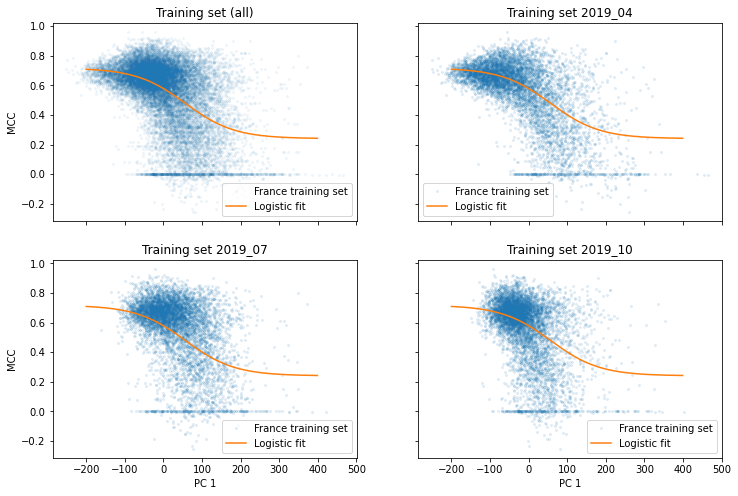

In [63]:
xfill = np.arange(-200, 400, 1)

nrow, ncol = 2, 2
fig, ax = plt.subplots(nrow, ncol, figsize=(12, 8), sharex=True, sharey=True)

ax[0,0].plot(xdata, ydata, 'o', ms=2, alpha=0.05)
ax[0,0].set_title('Training set (all)')

train_sizes = [0]
val_sizes = [0]
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    train_sizes.append(len(features_train[m])+train_sizes[m])
    val_sizes.append(len(features_val[m])+val_sizes[m])
    i = (m+1) // ncol
    j = (m+1) % ncol
    ax[i,j].plot(xdata[train_sizes[m]:train_sizes[m+1]], 
                 ydata[train_sizes[m]:train_sizes[m+1]], 'o', ms=2, alpha=0.1)
    ax[i,j].set_title('Training set {}'.format(month))

for i in range(nrow):
    for j in range(ncol):
        ax[i,j].plot(xfill, sigmoid(xfill, popt[0], popt[1], popt[2], popt[3]), color='C1')
        ax[i,j].legend(['France training set', 'Logistic fit'])
        
        if i == nrow - 1:
            ax[i,j].set_xlabel('PC 1')
        if j == 0:
            ax[i,j].set_ylabel('MCC')

plt.show()

### First average per image

In [48]:
# X_train = feature_vectors['train'].copy()
X_train = np.array(features_train)
X_train = X_train.mean(axis=-1).mean(axis=-1) # spatial average
X_train = X_train.reshape(X_train.shape[0] * X_train.shape[1], -1)

# X_val = feature_vectors['val'].copy()
X_val = np.array(features_val)
X_val = X_val.mean(axis=-1).mean(axis=-1) # spatial average
X_val = X_val.reshape(X_val.shape[0] * X_val.shape[1], -1)

pca = PCA(n_components=20)
pca.fit(X_train)

PCA(n_components=20)

In [66]:
from joblib import dump, load
dump(pca, '../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/pca_spatial_average.joblib')

['../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/pca_spatial_average.joblib']

In [49]:
X_pca_train = pca.transform(X_train)
X_pca_val = pca.transform(X_val)
print(pca.explained_variance_ratio_)

[8.42897647e-01 1.28521914e-01 5.63676962e-03 3.04193440e-03
 2.57633617e-03 2.29713027e-03 1.75232775e-03 1.55953232e-03
 1.47402572e-03 1.31234022e-03 1.06721374e-03 8.20822064e-04
 6.47512624e-04 5.54932845e-04 5.14109780e-04 4.37621158e-04
 3.85414612e-04 3.62370605e-04 3.39503683e-04 2.97335033e-04]


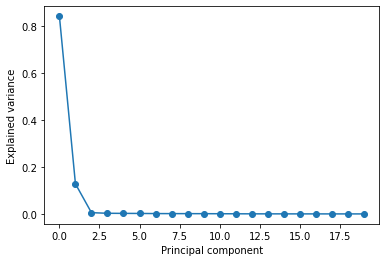

In [68]:
plt.plot(pca.explained_variance_ratio_, 'o-')
plt.xlabel('Principal component')
plt.ylabel('Explained variance')
plt.show()

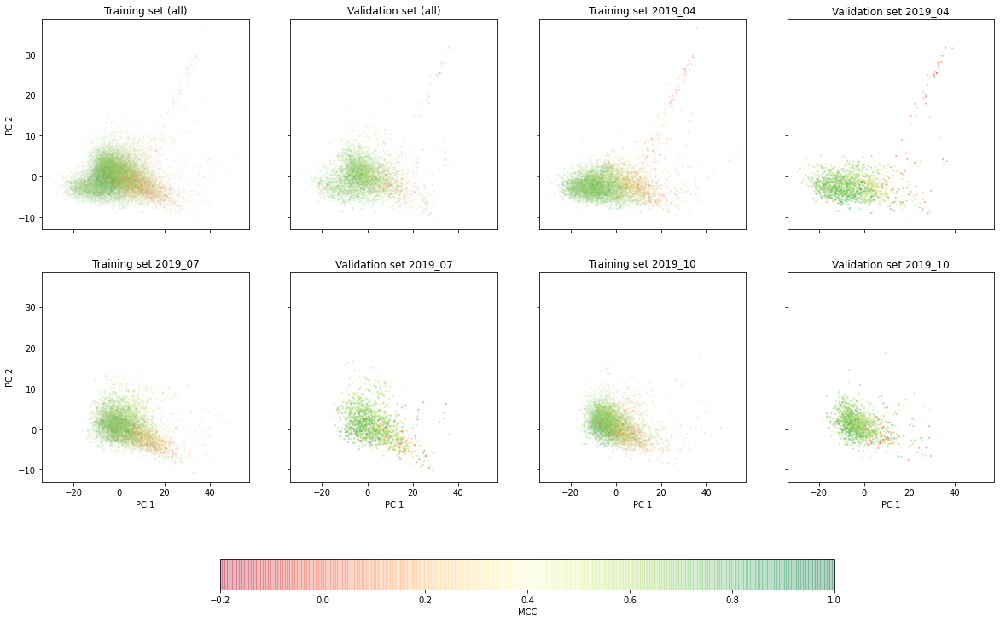

In [70]:
fig, ax = plt.subplots(2, 4, figsize=(20, 10), sharex=True, sharey=True)

ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.05, 
                c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('Training set (all)')

ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.1,
                c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_title('Validation set (all)')

train_sizes = [0]
val_sizes = [0]
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    train_sizes.append(len(features_train[m])+train_sizes[m])
    val_sizes.append(len(features_val[m])+val_sizes[m])
    i = (m+1) // 2
    j = (m+1)*2 % 4
    ax[i,j].scatter(X_pca_train[train_sizes[m]:train_sizes[m+1],0], 
                    X_pca_train[train_sizes[m]:train_sizes[m+1],1], 
                    s=2, alpha=0.1, c=mccs_train[train_sizes[m]:train_sizes[m+1]], cmap='RdYlGn', vmin=-0.2, vmax=1)
    im = ax[i,j+1].scatter(X_pca_val[val_sizes[m]:val_sizes[m+1],0], 
                      X_pca_val[val_sizes[m]:val_sizes[m+1],1], 
                      s=2, alpha=0.3, c=mccs_val[val_sizes[m]:val_sizes[m+1]], cmap='RdYlGn', vmin=-0.2, vmax=1)
    ax[i,j].set_title('Training set {}'.format(month))
    ax[i,j+1].set_title('Validation set {}'.format(month))
    
    if i == 1:
        ax[i,j].set_xlabel('PC 1')
        ax[i,j+1].set_xlabel('PC 1')
    if j == 0:
        ax[i,j].set_ylabel('PC 2')
    

cax = fig.add_axes([0.27, -0.05, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('MCC')

plt.show()

In [77]:
# fit sigmoid
xdata = X_pca_train[:,0]
ydata = mccs_train
p0 = [max(ydata), np.median(xdata), 1, min(ydata)] # this is an mandatory initial guess

popt, pcov = curve_fit(sigmoid, xdata, ydata, p0, method='dogbox')

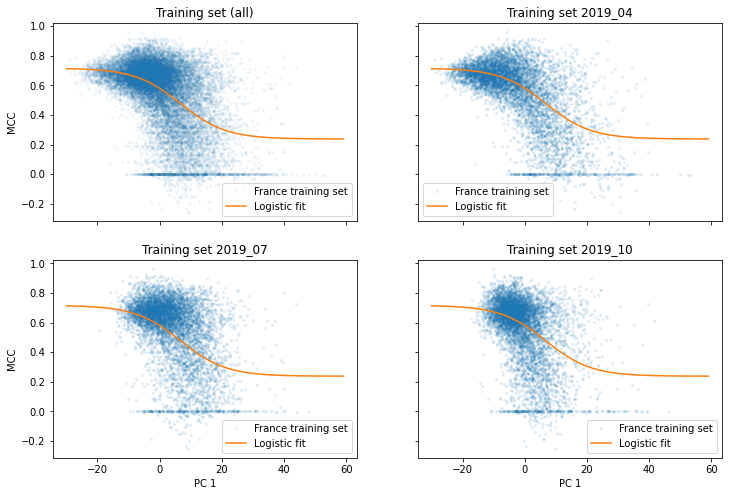

In [80]:
xfill = np.arange(-30, 60, 1)

nrow, ncol = 2, 2
fig, ax = plt.subplots(nrow, ncol, figsize=(12, 8), sharex=True, sharey=True)

ax[0,0].plot(xdata, ydata, 'o', ms=2, alpha=0.05)
ax[0,0].set_title('Training set (all)')

train_sizes = [0]
val_sizes = [0]
for m, month in enumerate(['2019_04', '2019_07', '2019_10']):
    train_sizes.append(len(features_train[m])+train_sizes[m])
    val_sizes.append(len(features_val[m])+val_sizes[m])
    i = (m+1) // ncol
    j = (m+1) % ncol
    ax[i,j].plot(xdata[train_sizes[m]:train_sizes[m+1]], 
                 ydata[train_sizes[m]:train_sizes[m+1]], 'o', ms=2, alpha=0.1)
    ax[i,j].set_title('Training set {}'.format(month))

for i in range(nrow):
    for j in range(ncol):
        ax[i,j].plot(xfill, sigmoid(xfill, popt[0], popt[1], popt[2], popt[3]), color='C1')
        ax[i,j].legend(['France training set', 'Logistic fit'])
        
        if i == nrow - 1:
            ax[i,j].set_xlabel('PC 1')
        if j == 0:
            ax[i,j].set_ylabel('MCC')

plt.show()

In [82]:
mcc_value = 0.5
np.log(popt[0] / (mcc_value - popt[3]) - 1) / (-popt[2]) + popt[1]

5.2988009029202905

## India: Apply features and PCA

### Dataloaders

In [ ]:
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'
months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]
feature_vectors_india = {}
for month in months:
    image_directory = os.path.join(base_dir, month)
    feature_vectors_india[month] = np.zeros((len(os.listdir(image_directory)), 512, 8, 8))
india_images = {}

for month in months[2:]:
    print(month)
    print()
    # ==================== USER SETTINGS ==================== #
    image_directory = os.path.join(base_dir, month)
    batch_size = 8
    save_dir = '../results/india/{}/planet/{}'.format(model_name, month)
    # ======================================================= #
    
    image_names = sorted(os.listdir(image_directory))
    india_images[month] = [x.split('/')[-1] for x in list(image_names)]
    dataset = PlanetDatasetNoLabels(image_directory, image_names=image_names, image_suffix='')
    dataloader = gluon.data.DataLoader(dataset, batch_size=batch_size)

    # initialize metrics
    for batch_i, img in enumerate(dataloader):

        features = model.features(img)
        feature_vectors_india[month][batch_i*batch_size: (batch_i+1)*batch_size] = features.asnumpy()

In [103]:
# save feature vectors
save_dir = '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for month in months[2:]:
    save_name = 'feature_vectors_{}.npy'.format(month)
    np.save(os.path.join(save_dir, save_name), feature_vectors_india[month])

In [104]:
X_pca_india = {}
for month in months[2:]:
    X_pca_india[month] = pca.transform(feature_vectors_india[month].reshape(
        feature_vectors_india[month].shape[0], -1))

### Plot alongside France

In [2]:
from joblib import dump, load
pca = load('../results/france/sherrie10k/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/pca_spatial_average.joblib')

In [4]:
save_dir = '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/'
months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]
X_pca_india = {}
for month in months:
    features_month = np.load(os.path.join(save_dir, 'feature_vectors_{}.npy'.format(month)))
    
    # spatially averaged one
    X_pca_india[month] = pca.transform(features_month.mean(axis=-1).mean(axis=-1))
    
    # full features
#     X_pca_india[month] = pca.transform(features_month.reshape(features_month.shape[0], -1))

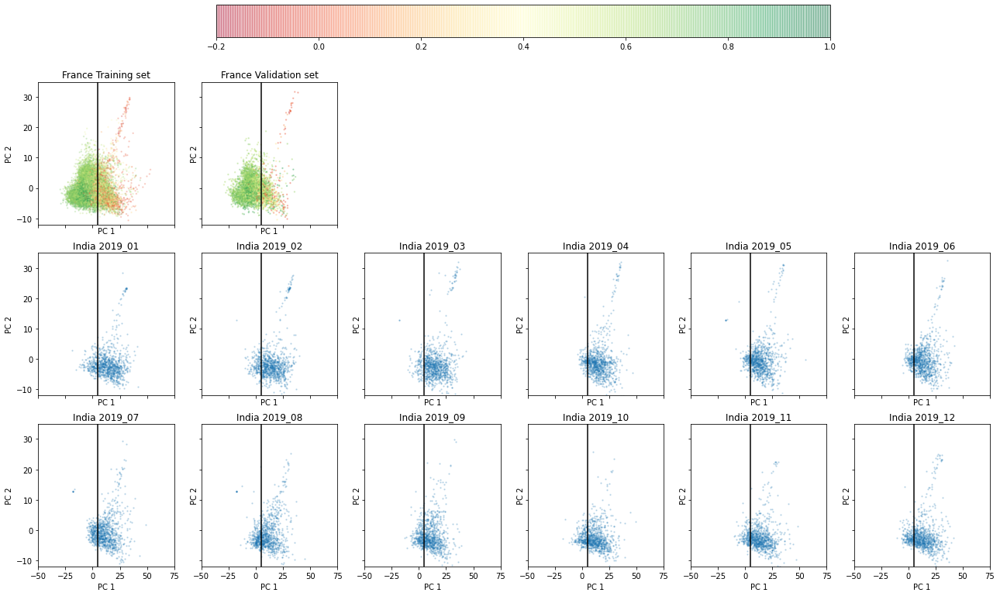

In [85]:
nrow = 3
ncol = 6
ymin = -12
ymax = 35
xmin = -50
xmax = 75
vline_x = 5

fig, ax = plt.subplots(nrow, ncol, figsize=(22, 11.5), sharex=True, sharey=True)
ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.2, c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_xlabel('PC 1')
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('France Training set')
ax[0,0].vlines(vline_x, -200, 600, color='k')

im = ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.3, c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_xlabel('PC 1')
ax[0,1].set_ylabel('PC 2')
ax[0,1].set_title('France Validation set')
ax[0,1].vlines(vline_x, -200, 600, color='k')

cax = fig.add_axes([0.27, 0.95, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')

for m, month in enumerate(months):
    i = m // ncol
    j = m % ncol
    ax[i+1,j].scatter(X_pca_india[month][:,0], X_pca_india[month][:,1], s=2, alpha=0.2)
    ax[i+1,j].set_xlabel('PC 1')
    ax[i+1,j].set_ylabel('PC 2')
    ax[i+1,j].set_title('India {}'.format(month))
    ax[i+1,j].vlines(vline_x, -200, 600, color='k')

for i in range(2, ncol):
    ax[0,i].axis('off')
    
for i in range(nrow):
    for j in range(ncol):
        ax[i,j].set_ylim([ymin, ymax])
        ax[i,j].set_xlim([xmin, xmax])
    
plt.show()

### Visualize images with high and low PC 1

In [5]:
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'
india_images = {}
for month in months:
    image_directory = os.path.join(base_dir, month)
    image_names = sorted(os.listdir(image_directory))
    india_images[month] = [x.split('/')[-1] for x in list(image_names)]

In [6]:
pc_df = pd.DataFrame({})
for month in months:
    pc_df = pd.concat([pc_df, pd.DataFrame({
        'month': [month] * len(india_images[month]),
        'image_name': india_images[month],
        'PC1': X_pca_india[month][:,0]
    })])
pc_df['image_id'] = pc_df['image_name'].str[:5]
pc_df = pc_df.reset_index(drop=True)

In [7]:
pc_df.head()

,month,image_name,PC1,image_id
0,2019_01,00000_2019_01.tif,12.398026,00000
1,2019_01,00001_2019_01.tif,6.146786,00001
2,2019_01,00002_2019_01.tif,17.662714,00002
3,2019_01,00003_2019_01.tif,19.626845,00003
4,2019_01,00004_2019_01.tif,23.212987,00004


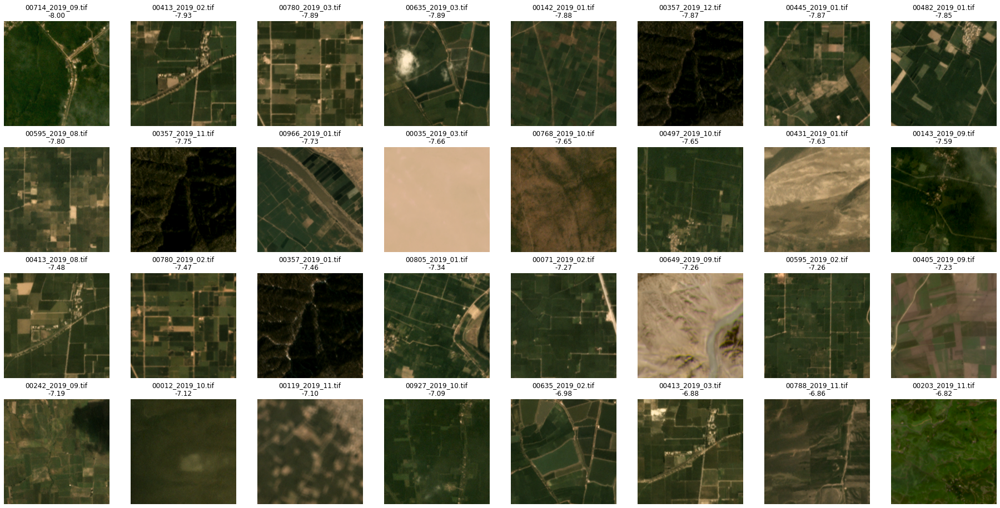

In [93]:
# lowest PC 1
n_samples = 32
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'

nrow = 4
ncol = 8
fig, ax = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
for k, row in pc_df.sort_values('PC1').reset_index(drop=True).iloc[64:].reset_index(drop=True).iterrows():
    if k >= n_samples:
        break
    img = imageio.imread(os.path.join(base_dir, row['month'], row['image_name']))
    img = img[:256,:256,:3]
    i = k // ncol
    j = k % ncol
    ax[i,j].imshow(img)
    ax[i,j].set_title(row['image_name'] + '\n{:0.2f}'.format(row['PC1']))
    ax[i,j].axis('off')
    
plt.show()

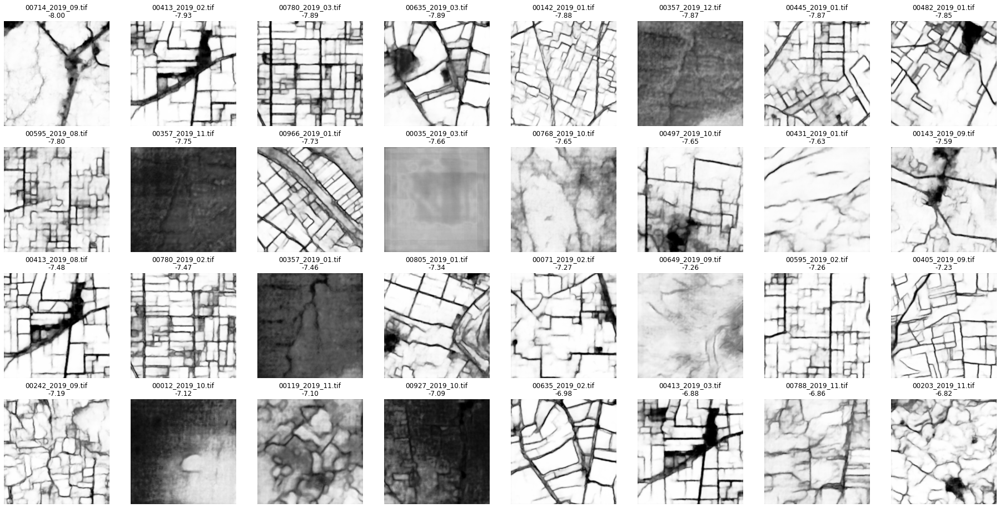

In [23]:
# lowest PC 1 - Model predictions
n_samples = 32
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'
results_dir = '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/planet/'

nrow = 4
ncol = 8
fig, ax = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
for k, row in pc_df.sort_values('PC1').reset_index(drop=True).iloc[64:].reset_index(drop=True).iterrows():
    if k >= n_samples:
        break
    img = imageio.imread(os.path.join(base_dir, row['month'], row['image_name']))
    img = img[:256,:256,:3]
    i = k // ncol
    j = k % ncol
    pred = np.load(os.path.join(results_dir, row['month'], 'extent_predictions', row['image_name'].split('_')[0]+'.npy'))
    ax[i,j].imshow(pred, vmin=0, vmax=1, cmap='Greys_r')
    ax[i,j].set_title(row['image_name'] + '\n{:0.2f}'.format(row['PC1']))
    ax[i,j].axis('off')
    
plt.show()

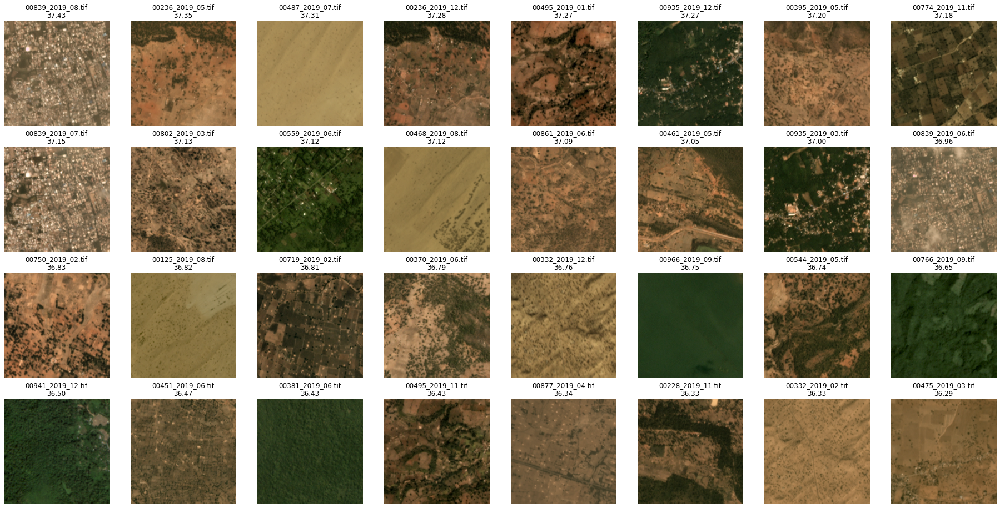

In [29]:
# highest PC 1
n_samples = 32
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'

nrow = 4
ncol = 8
fig, ax = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
for k, row in pc_df.sort_values('PC1', ascending=False).reset_index(drop=True).iloc[64:].reset_index(drop=True).iterrows():
    if k >= n_samples:
        break
    img = imageio.imread(os.path.join(base_dir, row['month'], row['image_name']))
    img = img[:256,:256,:3]
    i = k // ncol
    j = k % ncol
    ax[i,j].imshow(img)
    ax[i,j].set_title(row['image_name'] + '\n{:0.2f}'.format(row['PC1']))
    ax[i,j].axis('off')
    
plt.show()

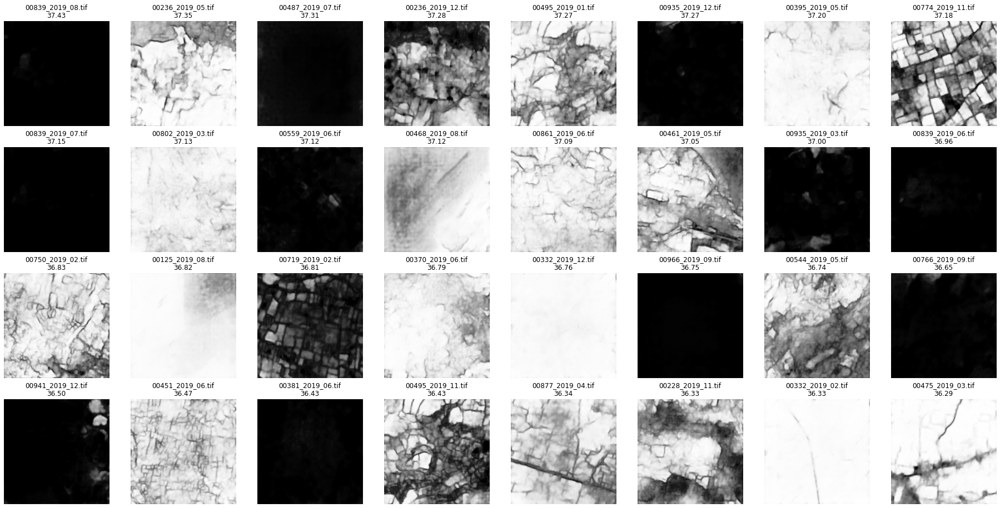

In [30]:
# lowest PC 1 - Model predictions
n_samples = 32
base_dir = '../data/planet/india/random/monthly_mosaics_renamed_clipped_merged/'
results_dir = '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/planet/'

nrow = 4
ncol = 8
fig, ax = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))
for k, row in pc_df.sort_values('PC1', ascending=False).reset_index(drop=True).iloc[64:].reset_index(drop=True).iterrows():
    if k >= n_samples:
        break
    img = imageio.imread(os.path.join(base_dir, row['month'], row['image_name']))
    img = img[:256,:256,:3]
    i = k // ncol
    j = k % ncol
    pred = np.load(os.path.join(results_dir, row['month'], 'extent_predictions', row['image_name'].split('_')[0]+'.npy'))
    ax[i,j].imshow(pred, vmin=0, vmax=1, cmap='Greys_r')
    ax[i,j].set_title(row['image_name'] + '\n{:0.2f}'.format(row['PC1']))
    ax[i,j].axis('off')
    
plt.show()

### Plot on map of India

In [97]:
india_samples = pd.read_csv('../data/planet/india/random/bbox1000.csv')
india_samples['image_id'] = india_samples['image_id'].astype(str).str.zfill(5)
india_samples['x'] = (india_samples['min_lon'] + india_samples['max_lon']) / 2.
india_samples['y'] = (india_samples['min_lat'] + india_samples['max_lat']) / 2.
india_samples.head()

,image_id,min_lon,min_lat,max_lon,max_lat,x,y
0,00000,77.290850,9.704133,77.303176,9.716283,77.297013,9.710208
1,00001,78.550178,12.225257,78.562610,12.237407,78.556394,12.231332
2,00002,70.750019,25.691702,70.763502,25.703852,70.756760,25.697777
3,00003,83.431280,18.745315,83.444111,18.757465,83.437695,18.751390
4,00004,84.124311,23.181774,84.137528,23.193924,84.130920,23.187849


In [99]:
pc_subset = pc_df.sort_values('PC1').reset_index(drop=True).iloc[21:].reset_index(drop=True)
india_samples_pc = india_samples.merge(pc_subset, on='image_id', how='right')

In [100]:
india_samples_pc.to_csv(
    '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/resuneta_features_spatial_average_PC1.csv',
    index=False)

In [2]:
# india_samples_pc = pd.read_csv(
#     '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/resuneta_features_PC1.csv')

india_samples_pc = pd.read_csv(
    '../results/india/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/resuneta_features_spatial_average_PC1.csv')

In [4]:
india = gpd.read_file('../mount/data/gadm36_IND_shp/gadm36_IND_0.shp')

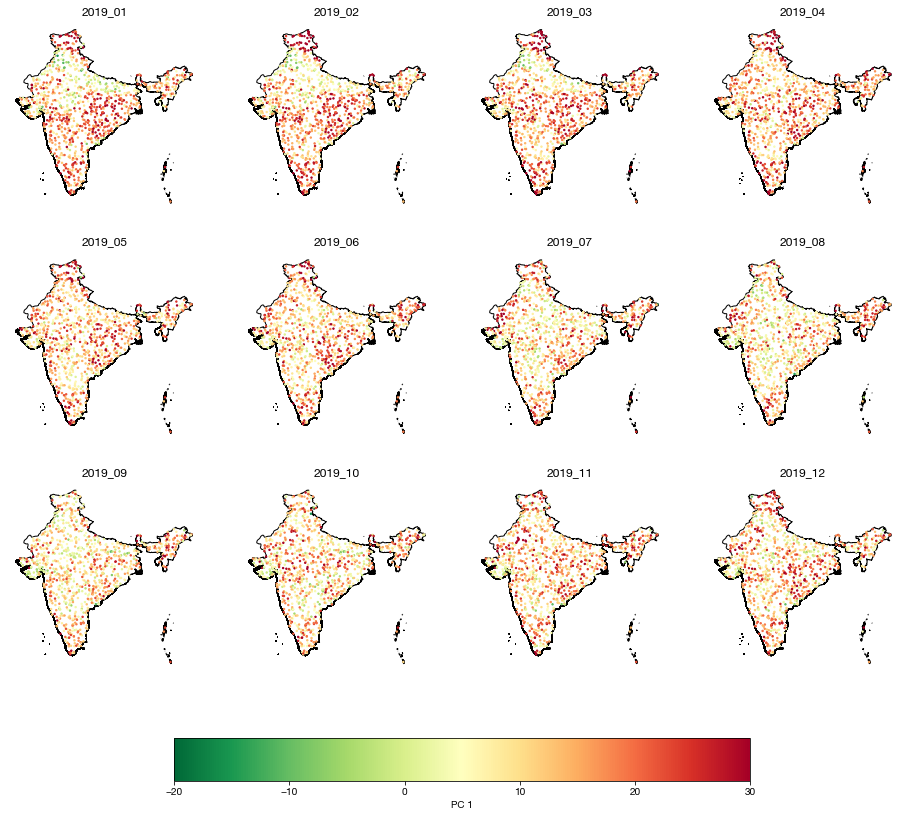

In [6]:
months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]
nrow = 3
ncol = 4
fig, ax = plt.subplots(nrow, ncol, figsize=(ncol*4, nrow*4))

for k, month in enumerate(months):
    india_samples_pc_month = india_samples_pc[india_samples_pc['month'] == month]
    i = k // ncol
    j = k % ncol
    india.plot(ax=ax[i,j], edgecolor='black', color='white')
    im = ax[i,j].scatter(india_samples_pc_month['x'], india_samples_pc_month['y'], 
                         c=india_samples_pc_month['PC1'], vmin=-20, vmax=30, s=2, cmap='RdYlGn_r')
    ax[i,j].set_title(month)
    ax[i,j].axis('off')
    
cax = fig.add_axes([0.27, 0, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('PC 1')
plt.show()

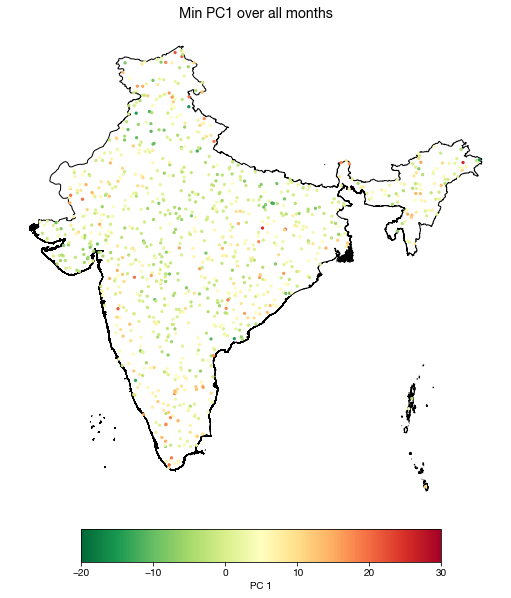

In [7]:
india_samples_pc_min = india_samples_pc.groupby('image_id').min().reset_index(drop=True)

fig, ax = plt.subplots(1, figsize=(10,9))
india.plot(ax=ax, edgecolor='black', color='white')
im = plt.scatter(india_samples_pc_min['x'], india_samples_pc_min['y'], 
                 c=india_samples_pc_min['PC1'], vmin=-20, vmax=30, s=5, cmap='RdYlGn_r')
plt.title('Min PC1 over all months', fontsize=14)
plt.axis('off')
    
cax = fig.add_axes([0.27, 0.05, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('PC 1')
plt.show()

## Africa

In [3]:
# Senegal
# base_dir = '../data/planet/senegal/monthly_mosaics_renamed_clipped_merged/'
# months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]

# Malawi
base_dir = '../data/planet/malawi/monthly_mosaics_renamed_clipped_merged/'
months = ['2018_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]

# Ghana
# base_dir = '../data/planet/ghana/udry/monthly_mosaics_renamed_clipped_merged/'
# months = ['2017_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]

feature_vectors_africa = {}
# for month in months:
#     image_directory = os.path.join(base_dir, month)
#     feature_vectors_africa[month] = np.zeros((len(os.listdir(image_directory)), 512, 8, 8))
    
#     if not os.path.exists(os.path.join(save_base_dir, month)):
#         os.makedirs(os.path.join(save_base_dir, month))
        
africa_images = {}

for month in months:
    print(month)
    print()
    # ==================== USER SETTINGS ==================== #
    image_directory = os.path.join(base_dir, month)
    batch_size = 8
    # ======================================================= #
    
    image_names = sorted(os.listdir(image_directory))
    africa_images[month] = [x.split('/')[-1] for x in list(image_names)]
#     dataset = PlanetDatasetNoLabels(image_directory, image_names=image_names, image_suffix='')
#     dataloader = gluon.data.DataLoader(dataset, batch_size=batch_size)

    # initialize metrics
#     for batch_i, img in enumerate(dataloader):

#         features = model.features(img)
#         feature_vectors_africa[month][batch_i*batch_size: (batch_i+1)*batch_size] = features.asnumpy()

2018_01

2018_02

2018_03

2018_04

2018_05

2018_06

2018_07

2018_08

2018_09

2018_10

2018_11

2018_12



In [7]:
# save feature vectors
# months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]
# save_dir = '../results/senegal/{}'.format(model_name)
save_dir = '../results/malawi/{}'.format(model_name)
# save_dir = '../results/ghana/udry/{}'.format(model_name)

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for month in months:
    save_name = 'feature_vectors_{}.npy'.format(month)
    np.save(os.path.join(save_dir, save_name), feature_vectors_africa[month])

In [8]:
X_pca_africa = {}
for month in months:
    features_month = np.load(os.path.join(save_dir, 'feature_vectors_{}.npy'.format(month)))
    
    # spatially averaged one
    X_pca_africa[month] = pca.transform(features_month.mean(axis=-1).mean(axis=-1))

In [ ]:
# get france data

#### Senegal

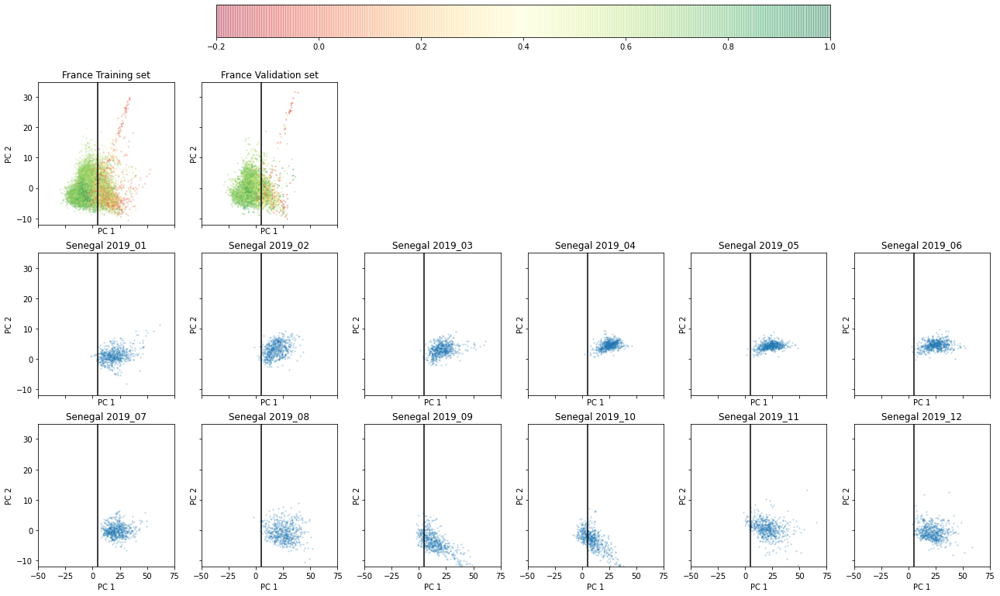

In [55]:
nrow = 3
ncol = 6
ymin = -12
ymax = 35
xmin = -50
xmax = 75
vline_x = 5

fig, ax = plt.subplots(nrow, ncol, figsize=(22, 11.5), sharex=True, sharey=True)
ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.2, c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_xlabel('PC 1')
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('France Training set')
ax[0,0].vlines(vline_x, -200, 600, color='k')

im = ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.3, c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_xlabel('PC 1')
ax[0,1].set_ylabel('PC 2')
ax[0,1].set_title('France Validation set')
ax[0,1].vlines(vline_x, -200, 600, color='k')

cax = fig.add_axes([0.27, 0.95, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')

for m, month in enumerate(months):
    i = m // ncol
    j = m % ncol
    ax[i+1,j].scatter(X_pca_senegal[month][:,0], X_pca_senegal[month][:,1], s=2, alpha=0.2)
    ax[i+1,j].set_xlabel('PC 1')
    ax[i+1,j].set_ylabel('PC 2')
    ax[i+1,j].set_title('Senegal {}'.format(month))
    ax[i+1,j].vlines(vline_x, -200, 600, color='k')

for i in range(2, ncol):
    ax[0,i].axis('off')
    
for i in range(nrow):
    for j in range(ncol):
        ax[i,j].set_ylim([ymin, ymax])
        ax[i,j].set_xlim([xmin, xmax])
    
plt.show()

In [14]:
months = ['2019_{}'.format(str(x).zfill(2)) for x in np.arange(1, 13)]
pc_df_africa = pd.DataFrame({})
for month in months:
    pc_df_africa = pd.concat([pc_df_africa, pd.DataFrame({
        'month': [month] * len(africa_images[month]),
        'image_name': africa_images[month],
        'PC1': X_pca_africa[month][:,0]
    })])
pc_df_africa['image_id'] = pc_df_africa['image_name'].str[:5]
pc_df_africa = pc_df_africa.reset_index(drop=True)
pc_df_africa.head()

,month,image_name,PC1,image_id
0,2019_01,00060_2019_01.tif,7.178573,00060
1,2019_01,00141_2019_01.tif,23.005245,00141
2,2019_01,00142_2019_01.tif,8.698861,00142
3,2019_01,00221_2019_01.tif,46.872675,00221
4,2019_01,00222_2019_01.tif,21.708732,00222


In [15]:
pc_df_africa.to_csv(
    '../results/senegal/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/image_PC1.csv', index=False)

In [76]:
africa_samples = pd.read_csv('../data/planet/senegal/bbox_tiles_overlap.csv')
africa_samples['image_id'] = africa_samples['image_id'].astype(str).str.zfill(5)
africa_samples['x'] = (africa_samples['min_lon'] + africa_samples['max_lon']) / 2.
africa_samples['y'] = (africa_samples['min_lat'] + africa_samples['max_lat']) / 2.
africa_samples.head()

,image_id,min_lon,min_lat,max_lon,max_lat,x,y
0,00060,-16.336502,14.252279,-16.324936,14.263559,-16.330719,14.257919
1,00141,-16.325178,14.252342,-16.313613,14.263622,-16.319396,14.257982
2,00142,-16.325243,14.263386,-16.313677,14.274666,-16.319460,14.269026
3,00221,-16.313791,14.241360,-16.302227,14.252640,-16.308009,14.247000
4,00222,-16.313855,14.252404,-16.302290,14.263684,-16.308072,14.258044


In [79]:
pc_africa_subset = pc_df_africa.sort_values('PC1').reset_index(drop=True).reset_index(drop=True)
africa_samples_pc = africa_samples.merge(pc_africa_subset, on='image_id', how='right')
africa_samples_pc.head()

,image_id,min_lon,min_lat,max_lon,max_lat,x,y,month,image_name,PC1
0,04221,-15.745806,13.6915,-15.734297,13.702753,-15.740052,13.697126,2019_10,04221_2019_10.tif,-8.126290
1,04221,-15.745806,13.6915,-15.734297,13.702753,-15.740052,13.697126,2019_09,04221_2019_09.tif,5.977847
2,04221,-15.745806,13.6915,-15.734297,13.702753,-15.740052,13.697126,2019_11,04221_2019_11.tif,9.836249
3,04221,-15.745806,13.6915,-15.734297,13.702753,-15.740052,13.697126,2019_01,04221_2019_01.tif,11.352422
4,04221,-15.745806,13.6915,-15.734297,13.702753,-15.740052,13.697126,2019_12,04221_2019_12.tif,12.009426


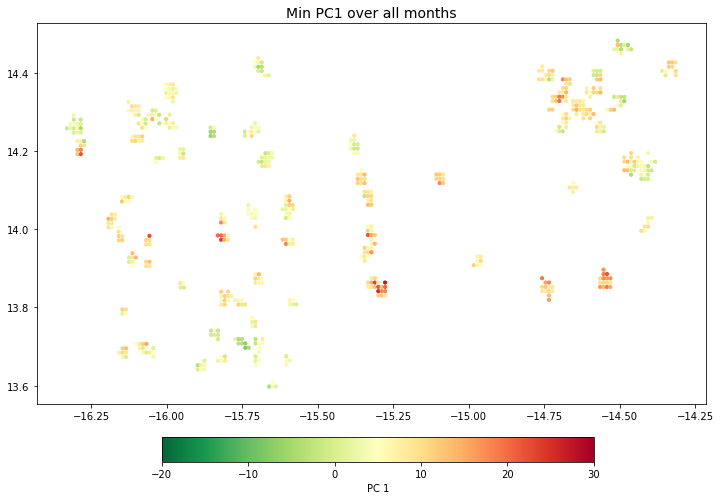

In [84]:
africa_samples_pc_min = africa_samples_pc.groupby('image_id').min().reset_index(drop=True)

fig, ax = plt.subplots(1, figsize=(12,7))
im = plt.scatter(africa_samples_pc_min['x'], africa_samples_pc_min['y'], 
                 c=africa_samples_pc_min['PC1'], vmin=-20, vmax=30, s=10, cmap='RdYlGn_r')
plt.title('Min PC1 over all months', fontsize=14)
    
cax = fig.add_axes([0.27, 0.01, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('PC 1')
plt.show()

#### Malawi

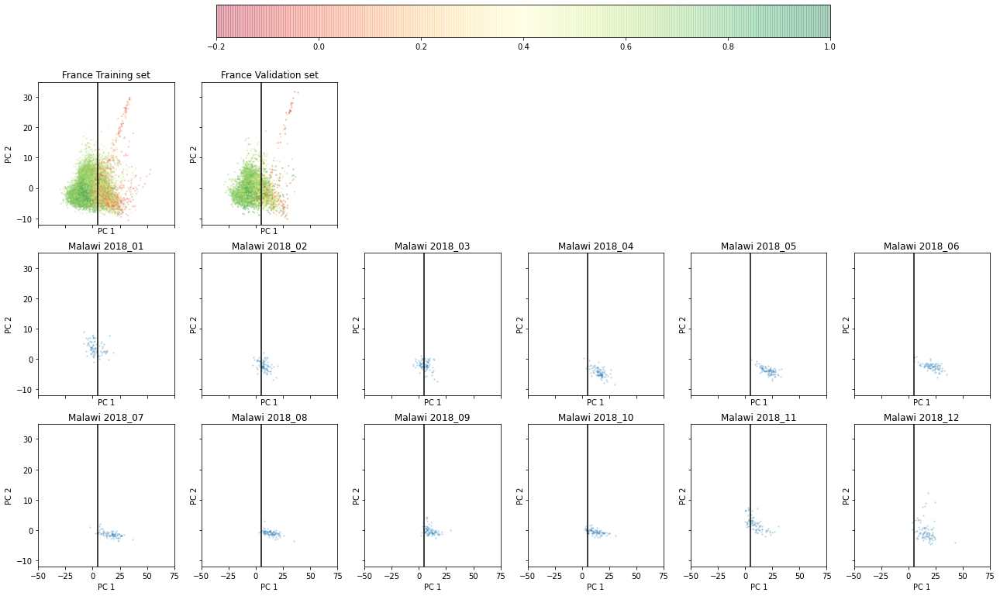

In [59]:
nrow = 3
ncol = 6
ymin = -12
ymax = 35
xmin = -50
xmax = 75
vline_x = 5

fig, ax = plt.subplots(nrow, ncol, figsize=(22, 11.5), sharex=True, sharey=True)
ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.2, c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_xlabel('PC 1')
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('France Training set')
ax[0,0].vlines(vline_x, -200, 600, color='k')

im = ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.3, c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_xlabel('PC 1')
ax[0,1].set_ylabel('PC 2')
ax[0,1].set_title('France Validation set')
ax[0,1].vlines(vline_x, -200, 600, color='k')

cax = fig.add_axes([0.27, 0.95, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')

for m, month in enumerate(months):
    i = m // ncol
    j = m % ncol
    ax[i+1,j].scatter(X_pca_africa[month][:,0], X_pca_africa[month][:,1], s=2, alpha=0.2)
    ax[i+1,j].set_xlabel('PC 1')
    ax[i+1,j].set_ylabel('PC 2')
    ax[i+1,j].set_title('Malawi {}'.format(month))
    ax[i+1,j].vlines(vline_x, -200, 600, color='k')

for i in range(2, ncol):
    ax[0,i].axis('off')
    
for i in range(nrow):
    for j in range(ncol):
        ax[i,j].set_ylim([ymin, ymax])
        ax[i,j].set_xlim([xmin, xmax])
    
plt.show()

In [9]:
pc_df_africa = pd.DataFrame({})
for month in months:
    pc_df_africa = pd.concat([pc_df_africa, pd.DataFrame({
        'month': [month] * len(africa_images[month]),
        'image_name': africa_images[month],
        'PC1': X_pca_africa[month][:,0]
    })])
pc_df_africa['image_id'] = pc_df_africa['image_name'].str[:5]
pc_df_africa = pc_df_africa.reset_index(drop=True)
pc_df_africa.head()

,month,image_name,PC1,image_id
0,2018_01,00023_2018_01.tif,12.375708,00023
1,2018_01,00061_2018_01.tif,4.465502,00061
2,2018_01,00076_2018_01.tif,10.943148,00076
3,2018_01,00085_2018_01.tif,9.400999,00085
4,2018_01,00086_2018_01.tif,18.590825,00086


In [10]:
pc_df_africa.to_csv(
    '../results/malawi/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/image_PC1.csv', index=False)

In [65]:
africa_samples = pd.read_csv('../data/planet/malawi/bbox_tiles_overlap.csv')
africa_samples['image_id'] = africa_samples['image_id'].astype(str).str.zfill(5)
africa_samples['x'] = (africa_samples['min_lon'] + africa_samples['max_lon']) / 2.
africa_samples['y'] = (africa_samples['min_lat'] + africa_samples['max_lat']) / 2.
africa_samples.head()

,image_id,min_lon,min_lat,max_lon,max_lat,x,y
0,00023,33.327012,-13.294877,33.338483,-13.283642,33.332747,-13.289259
1,00061,33.326459,-12.875066,33.337910,-12.863832,33.332185,-12.869449
2,00076,33.326246,-12.709348,33.337690,-12.698113,33.331968,-12.703731
3,00085,33.338291,-13.294862,33.349762,-13.283626,33.344027,-13.289244
4,00086,33.338276,-13.283815,33.349746,-13.272579,33.344011,-13.278197


In [66]:
pc_africa_subset = pc_df_africa.sort_values('PC1').reset_index(drop=True).reset_index(drop=True)
africa_samples_pc = africa_samples.merge(pc_africa_subset, on='image_id', how='right')

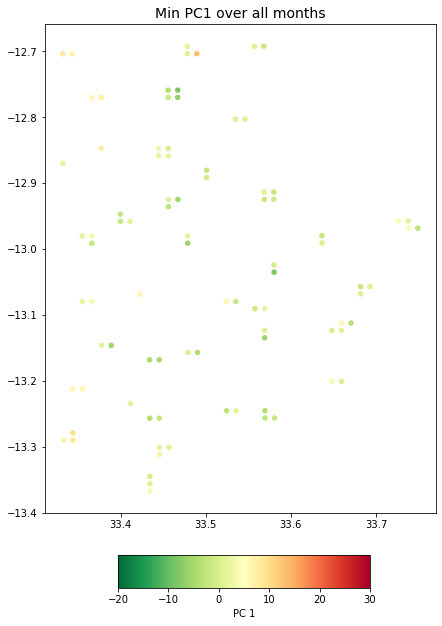

In [75]:
africa_samples_pc_min = africa_samples_pc.groupby('image_id').min().reset_index(drop=True)

fig, ax = plt.subplots(1, figsize=(7,9))
im = plt.scatter(africa_samples_pc_min['x'], africa_samples_pc_min['y'], 
                 c=africa_samples_pc_min['PC1'], vmin=-20, vmax=30, s=20, cmap='RdYlGn_r')
plt.title('Min PC1 over all months', fontsize=14)
    
cax = fig.add_axes([0.27, 0.01, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('PC 1')
plt.show()

#### Ghana

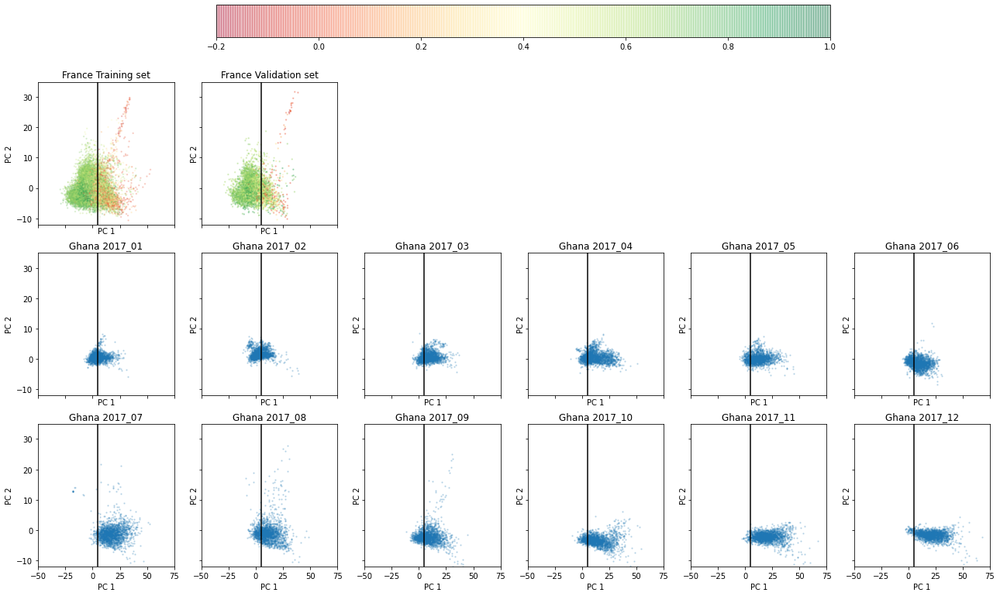

In [89]:
nrow = 3
ncol = 6
ymin = -12
ymax = 35
xmin = -50
xmax = 75
vline_x = 5

fig, ax = plt.subplots(nrow, ncol, figsize=(22, 11.5), sharex=True, sharey=True)
ax[0,0].scatter(X_pca_train[:,0], X_pca_train[:,1], s=2, alpha=0.2, c=mccs_train, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,0].set_xlabel('PC 1')
ax[0,0].set_ylabel('PC 2')
ax[0,0].set_title('France Training set')
ax[0,0].vlines(vline_x, -200, 600, color='k')

im = ax[0,1].scatter(X_pca_val[:,0], X_pca_val[:,1], s=2, alpha=0.3, c=mccs_val, cmap='RdYlGn', vmin=-0.2, vmax=1)
ax[0,1].set_xlabel('PC 1')
ax[0,1].set_ylabel('PC 2')
ax[0,1].set_title('France Validation set')
ax[0,1].vlines(vline_x, -200, 600, color='k')

cax = fig.add_axes([0.27, 0.95, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')

for m, month in enumerate(months):
    i = m // ncol
    j = m % ncol
    ax[i+1,j].scatter(X_pca_africa[month][:,0], X_pca_africa[month][:,1], s=2, alpha=0.2)
    ax[i+1,j].set_xlabel('PC 1')
    ax[i+1,j].set_ylabel('PC 2')
    ax[i+1,j].set_title('Ghana {}'.format(month))
    ax[i+1,j].vlines(vline_x, -200, 600, color='k')

for i in range(2, ncol):
    ax[0,i].axis('off')
    
for i in range(nrow):
    for j in range(ncol):
        ax[i,j].set_ylim([ymin, ymax])
        ax[i,j].set_xlim([xmin, xmax])
    
plt.show()

In [16]:
pc_df_africa = pd.DataFrame({})
for month in months:
    pc_df_africa = pd.concat([pc_df_africa, pd.DataFrame({
        'month': [month] * len(africa_images[month]),
        'image_name': africa_images[month],
        'PC1': X_pca_africa[month][:,0]
    })])
pc_df_africa['image_id'] = pc_df_africa['image_name'].str[:5]
pc_df_africa = pc_df_africa.reset_index(drop=True)
pc_df_africa.head()

,month,image_name,PC1,image_id
0,2017_01,00059_2017_01.tif,1.862131,00059
1,2017_01,00060_2017_01.tif,9.433166,00060
2,2017_01,00168_2017_01.tif,4.082168,00168
3,2017_01,00169_2017_01.tif,10.193838,00169
4,2017_01,00170_2017_01.tif,8.932094,00170


In [18]:
pc_df_africa.to_csv(
    '../results/ghana/udry/resunet-d6_2019_10_class-notreeexceptvines_nfilter-16_bs-8_lr-0.001_1x-8x-downsampled/image_PC1.csv', index=False)

In [91]:
africa_samples = pd.read_csv('../data/planet/ghana/udry/bbox_tiles_overlap.csv')
africa_samples['image_id'] = africa_samples['image_id'].astype(str).str.zfill(5)
africa_samples['x'] = (africa_samples['min_lon'] + africa_samples['max_lon']) / 2.
africa_samples['y'] = (africa_samples['min_lat'] + africa_samples['max_lat']) / 2.
africa_samples.head()

,image_id,min_lon,min_lat,max_lon,max_lat,x,y
0,00059,-1.308487,9.478821,-1.297132,9.490094,-1.302809,9.484458
1,00060,-1.308433,9.489867,-1.297078,9.501140,-1.302755,9.495503
2,00168,-1.297361,9.478767,-1.286006,9.490040,-1.291684,9.484404
3,00169,-1.297307,9.489812,-1.285951,9.501086,-1.291629,9.495449
4,00170,-1.297252,9.500858,-1.285896,9.512131,-1.291574,9.506495


In [92]:
pc_africa_subset = pc_df_africa.sort_values('PC1').reset_index(drop=True).reset_index(drop=True)
africa_samples_pc = africa_samples.merge(pc_africa_subset, on='image_id', how='right')

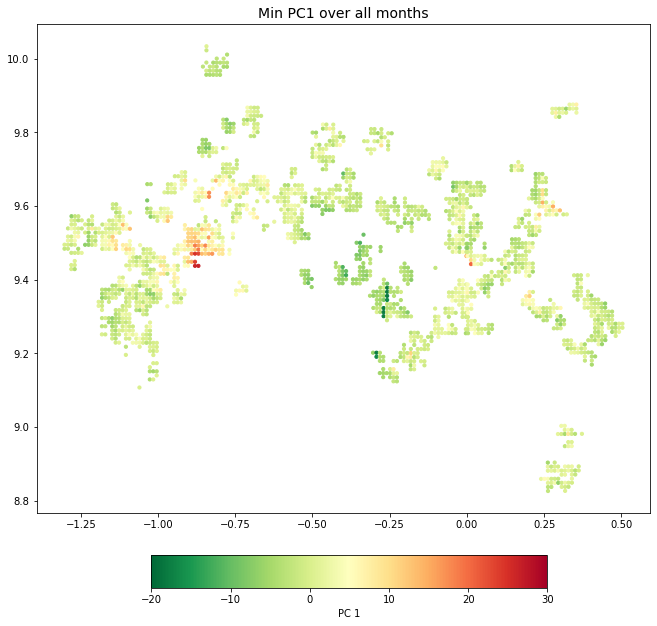

In [97]:
africa_samples_pc_min = africa_samples_pc.groupby('image_id').min().reset_index(drop=True)

fig, ax = plt.subplots(1, figsize=(11,9))
im = plt.scatter(africa_samples_pc_min['x'], africa_samples_pc_min['y'], 
                 c=africa_samples_pc_min['PC1'], vmin=-20, vmax=30, s=10, cmap='RdYlGn_r')
plt.title('Min PC1 over all months', fontsize=14)
    
cax = fig.add_axes([0.27, 0.01, 0.5, 0.05])
fig.colorbar(im, cax=cax, orientation='horizontal')
cax.set_xlabel('PC 1')
plt.show()